# Import Image

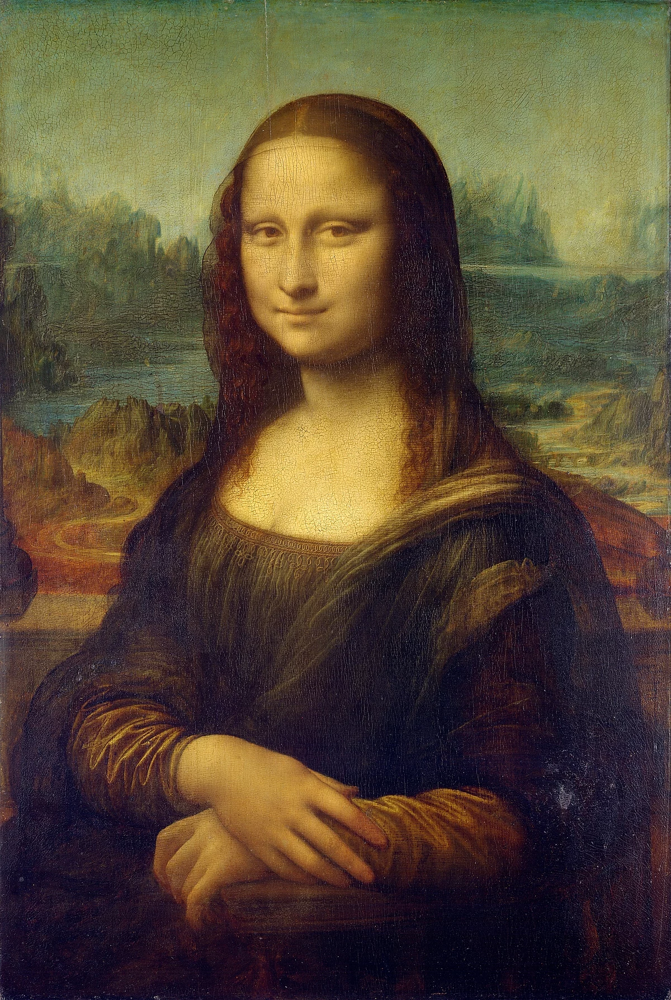

In [91]:
import numpy as np

#Use PIL to access image data
from PIL import Image
img = Image.open('monalisa.jpg')

#Create array from image data
M = np.array(img)

#Display array from image data
display(Image.fromarray(M))

# Reduce Image

array([[[105, 116,  89],
        [ 78,  88,  67],
        [ 83,  92,  75],
        ...,
        [ 93,  97,  82],
        [148, 147, 139],
        [102,  98,  95]],

       [[ 97, 108,  81],
        [106, 116,  94],
        [140, 149, 132],
        ...,
        [ 85,  90,  72],
        [ 70,  70,  59],
        [104, 101,  93]],

       [[ 99, 110,  83],
        [100, 110,  89],
        [ 62,  71,  54],
        ...,
        [ 76,  82,  60],
        [ 83,  83,  67],
        [ 30,  27,  15]],

       ...,

       [[ 88,  75,  86],
        [ 59,  47,  64],
        [ 47,  36,  60],
        ...,
        [ 36,  33,  54],
        [ 92,  86,  95],
        [104,  95, 109]],

       [[143, 132, 142],
        [ 80,  70,  90],
        [120, 115, 135],
        ...,
        [  7,   4,  23],
        [243, 238, 251],
        [ 82,  72,  87]],

       [[131, 123, 130],
        [ 47,  39,  60],
        [127, 124, 143],
        ...,
        [ 81,  75,  95],
        [ 23,  18,  33],
        [  4,   0,   9]]], dtype=uint8)
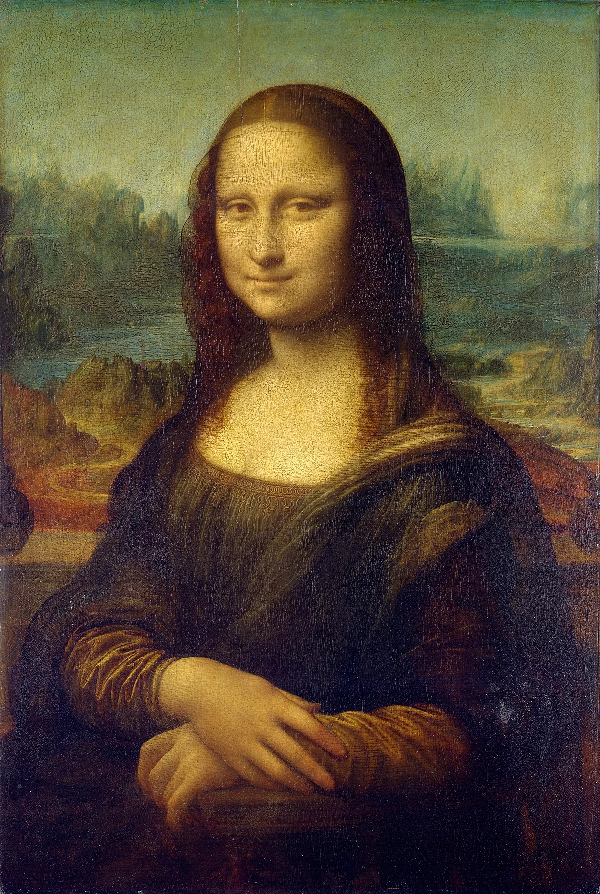

In [92]:
def reduce_image_size_by_n(image, n):

    # Get the height and width of the image
    height, width, channels = image.shape

    # Reduce the height and width by n
    new_height = height // n
    new_width = width // n

    # Create a new array to store the reduced image
    downsampled_image = np.zeros((new_height, new_width, channels), dtype=image.dtype)

    # Iterate over each pixel of the reduced image
    for i in range(new_height):
        for j in range(new_width):

            # Take every other pixel along each axis to reduce the image

            downsampled_image[i, j] = image[n*i, n*j]

    return downsampled_image

#Try the function using n = 2

reduced_M = reduce_image_size_by_n(M, 2)

display(reduced_M)

# Flip Image

array([[[102,  98,  95],
        [148, 147, 139],
        [ 93,  97,  82],
        ...,
        [ 83,  92,  75],
        [ 78,  88,  67],
        [105, 116,  89]],

       [[104, 101,  93],
        [ 70,  70,  59],
        [ 85,  90,  72],
        ...,
        [140, 149, 132],
        [106, 116,  94],
        [ 97, 108,  81]],

       [[ 30,  27,  15],
        [ 83,  83,  67],
        [ 76,  82,  60],
        ...,
        [ 62,  71,  54],
        [100, 110,  89],
        [ 99, 110,  83]],

       ...,

       [[104,  95, 109],
        [ 92,  86,  95],
        [ 36,  33,  54],
        ...,
        [ 47,  36,  60],
        [ 59,  47,  64],
        [ 88,  75,  86]],

       [[ 82,  72,  87],
        [243, 238, 251],
        [  7,   4,  23],
        ...,
        [120, 115, 135],
        [ 80,  70,  90],
        [143, 132, 142]],

       [[  4,   0,   9],
        [ 23,  18,  33],
        [ 81,  75,  95],
        ...,
        [127, 124, 143],
        [ 47,  39,  60],
        [131, 123, 130]]], dtype=uint8)
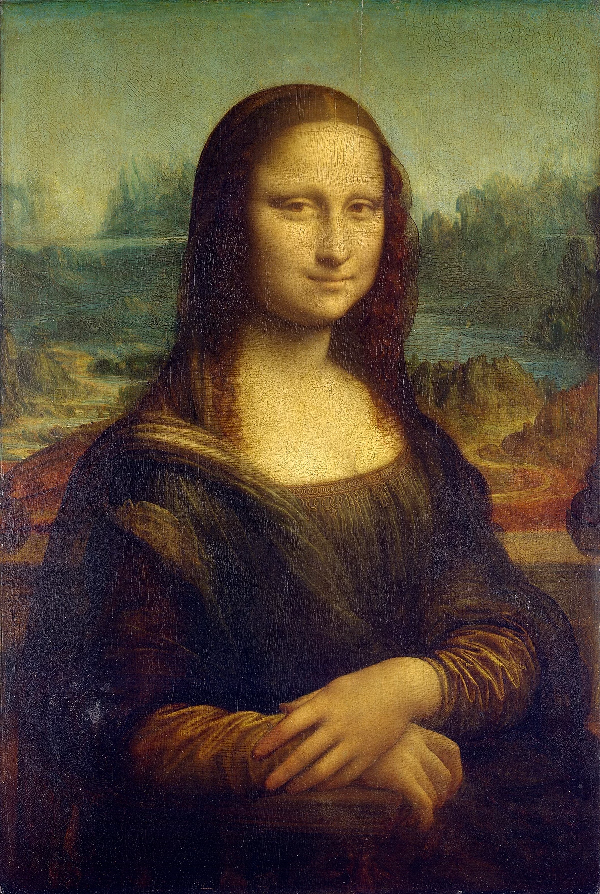

In [93]:
def flip_image(image):

  # Takes all rows in image (:) and reverses it the order of columns (::-1)
  flip_image = image[:, ::-1]
  return flip_image

#Try function using reduced image
display(flip_image(reduced_M))

# Rotate Image

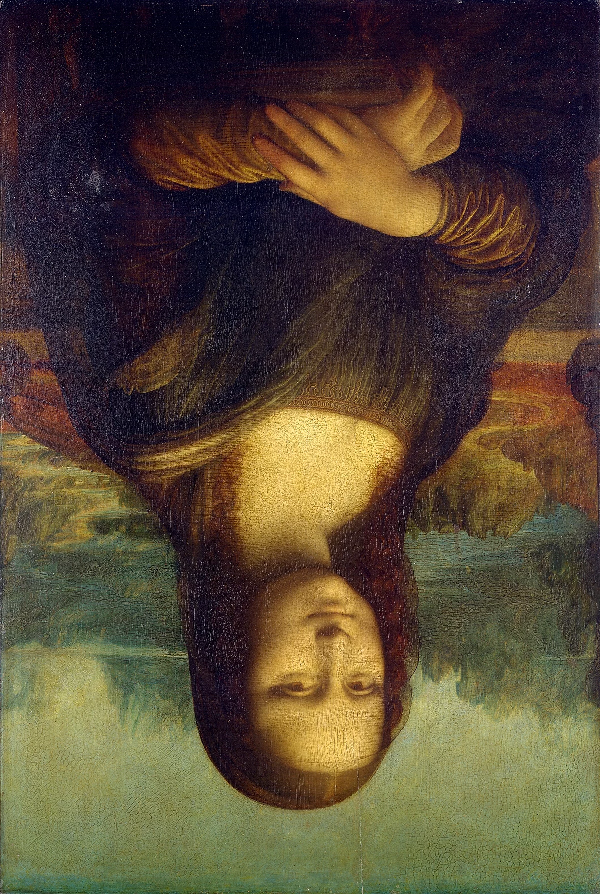

In [94]:
def rotate_image (image, n):
  # rotate image using rot90, use n to determine number of rotation
  rotated_img = Image.fromarray(np.rot90(image, k=n, axes=(1, 0)))
  return rotated_img

#rotate image twice (n=2)
display(rotate_image(reduced_M, 2))

# Crop Image

array([[[167, 151,  83],
        [139, 128,  79],
        [137, 128,  74],
        ...,
        [244, 201, 113],
        [209, 166,  80],
        [210, 168,  75]],

       [[109,  88,  36],
        [135, 125,  74],
        [142, 133,  77],
        ...,
        [185, 145,  54],
        [158, 117,  33],
        [227, 188,  94]],

       [[128, 113,  61],
        [118, 113,  60],
        [132, 120,  65],
        ...,
        [235, 196, 102],
        [242, 201, 119],
        [255, 222, 129]],

       ...,

       [[ 72,  56,  71],
        [ 20,   6,  20],
        [ 27,  15,  33],
        ...,
        [255, 240, 158],
        [243, 218, 131],
        [225, 195,  98]],

       [[ 17,   1,  15],
        [ 37,  23,  39],
        [ 33,  24,  38],
        ...,
        [255, 228, 144],
        [219, 192, 105],
        [205, 175,  83]],

       [[ 33,  17,  31],
        [ 38,  26,  42],
        [ 35,  25,  42],
        ...,
        [245, 215, 130],
        [235, 204, 114],
        [255, 227, 136]]], dtype=uint8)
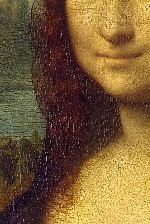

In [95]:
def crop_image(image, crop_ratio, zoom_ratio):

  #create focused part using crop_ratio and zoom_ratio of choice

  top = image.shape[0] // crop_ratio
  bottom = zoom_ratio * image.shape[0] // crop_ratio
  left = image.shape[1] // crop_ratio
  right = zoom_ratio * image.shape[1] // crop_ratio

  # Extract the focused part using array slicing
  focused_part = image[top:bottom, left:right]
  return focused_part

display(crop_image(reduced_M, 4, 2))

# Create Red, Green and Blue Channels

In [96]:
def RGB_image(image,image_color):

  if image_color == 'R':
    #make a copy of image for the color channel
    img_R = image.copy()
    #set other color channel to zero. Here Red is the first channel [0]
    img_R[:, :, (1, 2)] = 0
    return img_R

  elif image_color == 'G':
    img_G = image.copy()
    #set other color channel to zero. Here Green is the second channel [1]
    img_G[:, :, (0, 2)] = 0
    return img_G

  elif image_color == 'B':
    img_B = image.copy()
    #set other color channel to zero. Here Blue is the third channel [2]
    img_B[:, :, (0, 1)] = 0
    return img_B

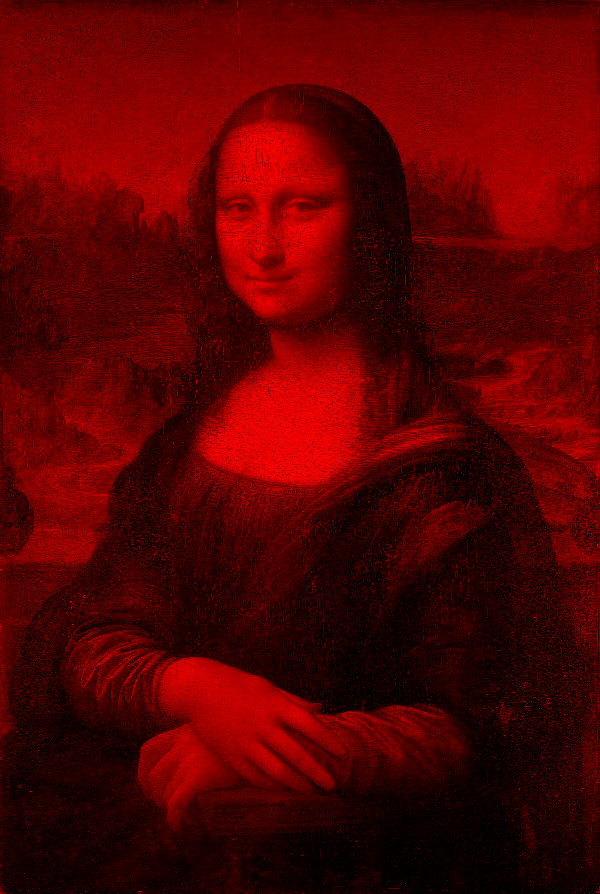

In [97]:
#Create red channel using function

M_red = Image.fromarray(RGB_image(reduced_M, 'R'))

display(M_red)

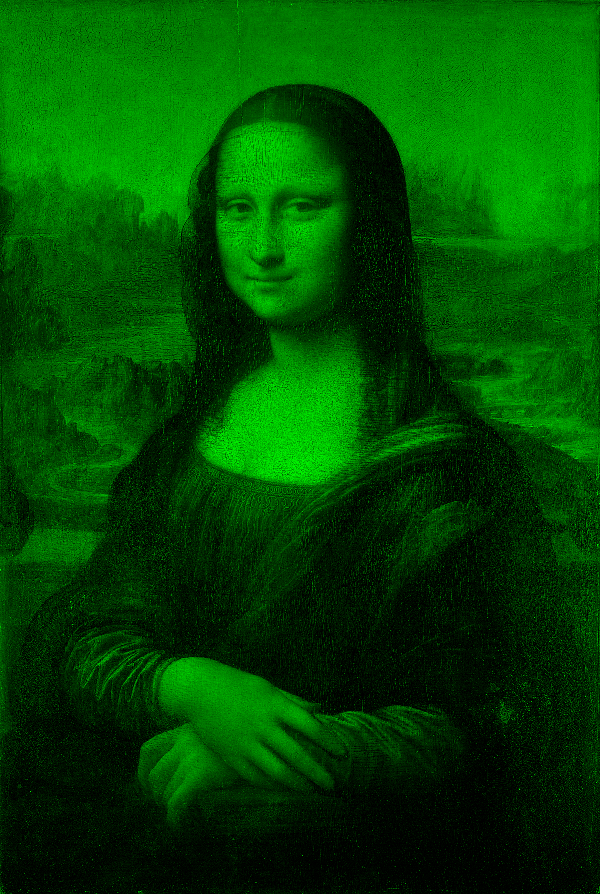

In [98]:
#Create green channel using function

M_green = Image.fromarray(RGB_image(reduced_M, 'G'))

display(M_green)

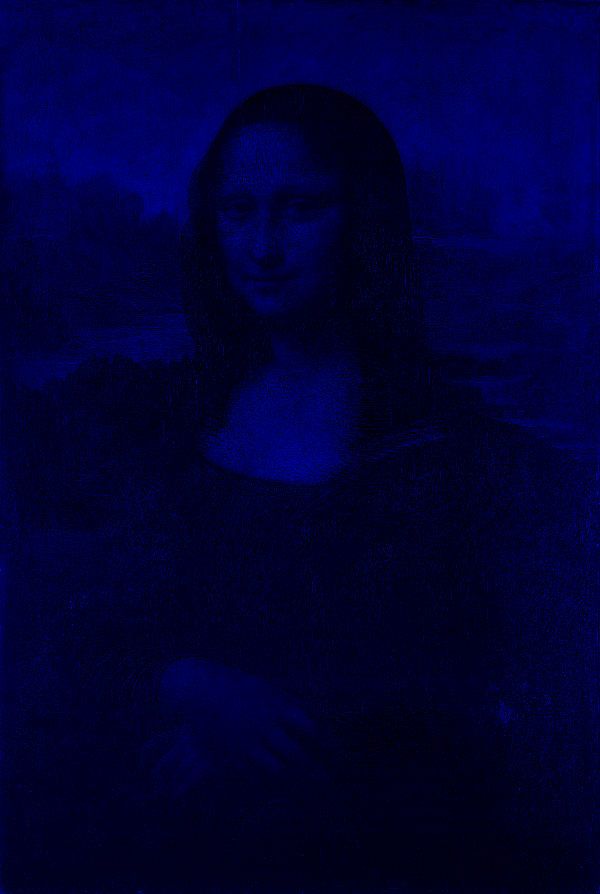

In [99]:
#Create blue channel using function

M_blue = Image.fromarray(RGB_image(reduced_M, 'B'))

display(M_blue)

# Add Sepia tone to Image

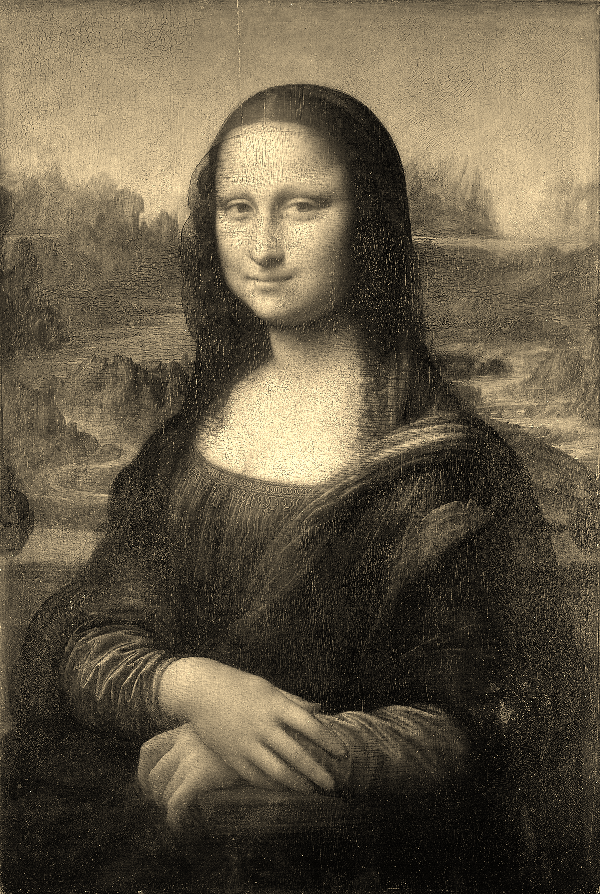

In [100]:
def apply_sepia(image):
    # Sepia transformation matrix
    sepia_matrix = np.array([[0.393, 0.769, 0.189],
                             [0.349, 0.686, 0.168],
                             [0.272, 0.534, 0.131]])

    # Apply the sepia transformation
    sepia_img = image.dot(sepia_matrix.T)  # Using matrix multiplication

    # Ensure values are within valid range [0, 255]
    sepia_img = np.clip(sepia_img, 0, 255)

    return sepia_img.astype(np.uint8)

# Apply sepia effect
M_sepia = Image.fromarray(apply_sepia(reduced_M))

display(M_sepia)

# Image Grayscale

array([[109,  82,  87, ...,  94, 146,  98],
       [101, 110, 144, ...,  86,  68, 100],
       [103, 104,  66, ...,  77,  81,  26],
       ...,
       [ 80,  52,  42, ...,  36,  88,  99],
       [136,  75, 118, ...,   7, 240,  76],
       [126,  43, 127, ...,  79,  21,   2]], dtype=uint8)
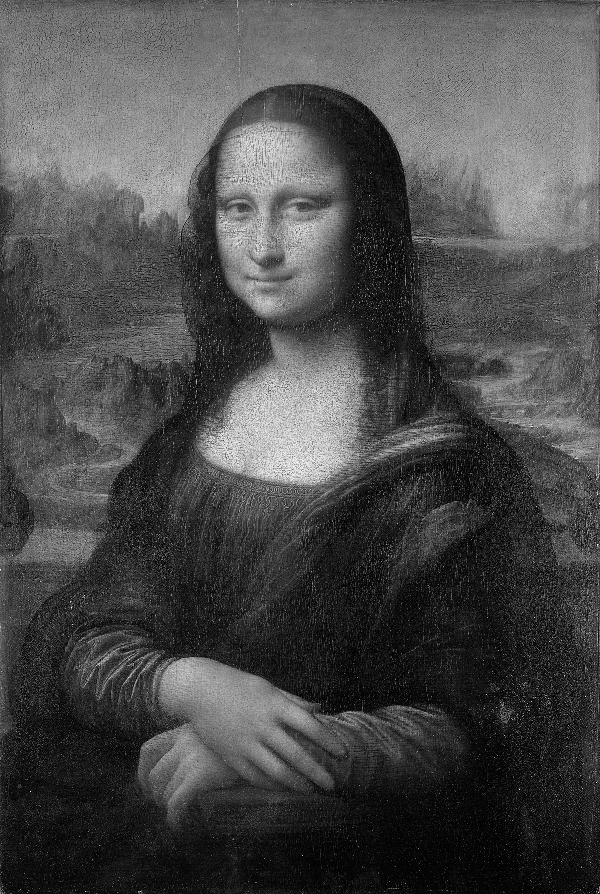

In [101]:
import numpy as np

def grayscale(image):
    # Convert the RGB image to grayscale using weighted average
    grayscale_img = np.dot(image[..., :3], [0.2989, 0.5870, 0.1140])

    # Ensure values are within valid range [0, 255]
    grayscale_img = np.clip(grayscale_img, 0, 255)

    # Convert to uint8 data type
    grayscale_img = grayscale_img.astype(np.uint8)

    return grayscale_img

# Convert the image to grayscale
M_gray = grayscale(reduced_M)

display(M_gray)

# Pixelate Image

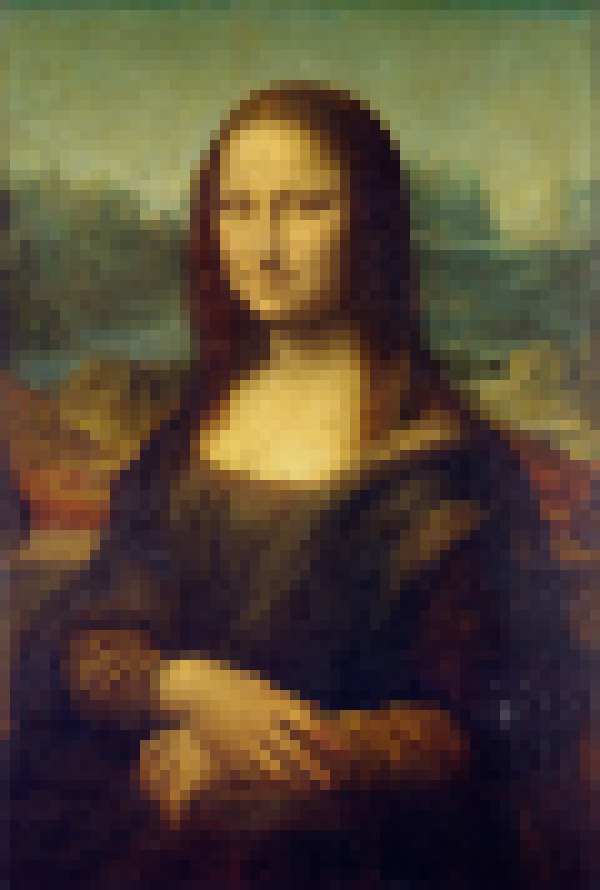

In [102]:
def pixelate_image(image, block_size):

    # Determine the number of blocks in each dimension
    num_blocks_y = image.shape[0] // block_size
    num_blocks_x = image.shape[1] // block_size

    # Calculate the average color for each block
    block_means = np.zeros((num_blocks_y, num_blocks_x, 3), dtype=np.uint8)
    for y in range(num_blocks_y):
        for x in range(num_blocks_x):
            block = image[y * block_size: (y + 1) * block_size,
                        x * block_size: (x + 1) * block_size]
            block_mean = np.mean(block, axis=(0, 1))
            block_means[y, x] = block_mean.astype(np.uint8)

    # Upsample block means to original image size
    pixelated_image = np.repeat(np.repeat(block_means, block_size, axis=0), block_size, axis=1)

    return pixelated_image

# Set the block size for pixelation (adjust as needed)
block_size = 10

# Pixelate the image
M_pixelated = Image.fromarray(pixelate_image(reduced_M, block_size))

display(M_pixelated)

# Binarize Image

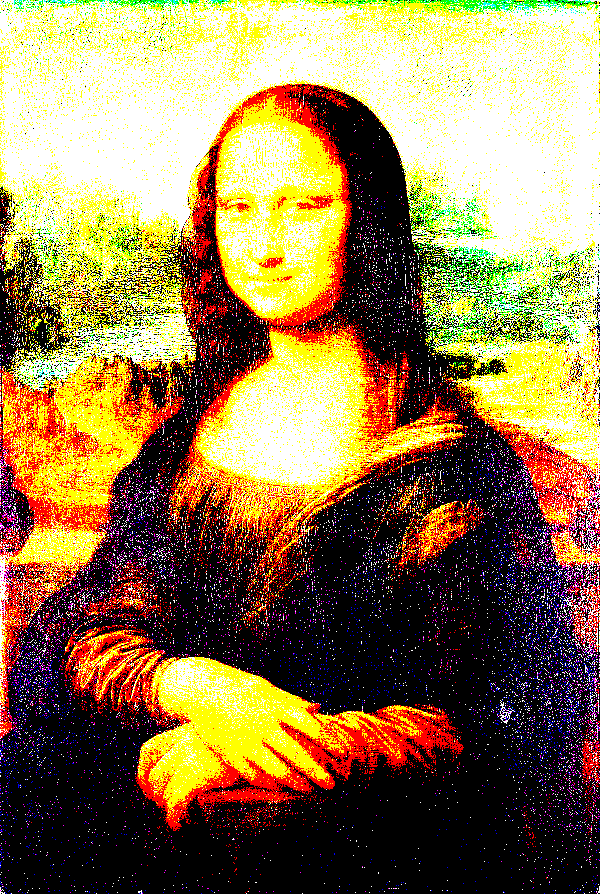

In [103]:
def binarize_image(image, threshold):

  #set pixel value greater than threshold to 255
  binarize_image = ((image > threshold) * 255).astype(np.uint8)

  return binarize_image

#set threshold
threshold = 68

M_binarized = Image.fromarray(binarize_image(reduced_M, threshold))

display(M_binarized)



# Blend Two Images

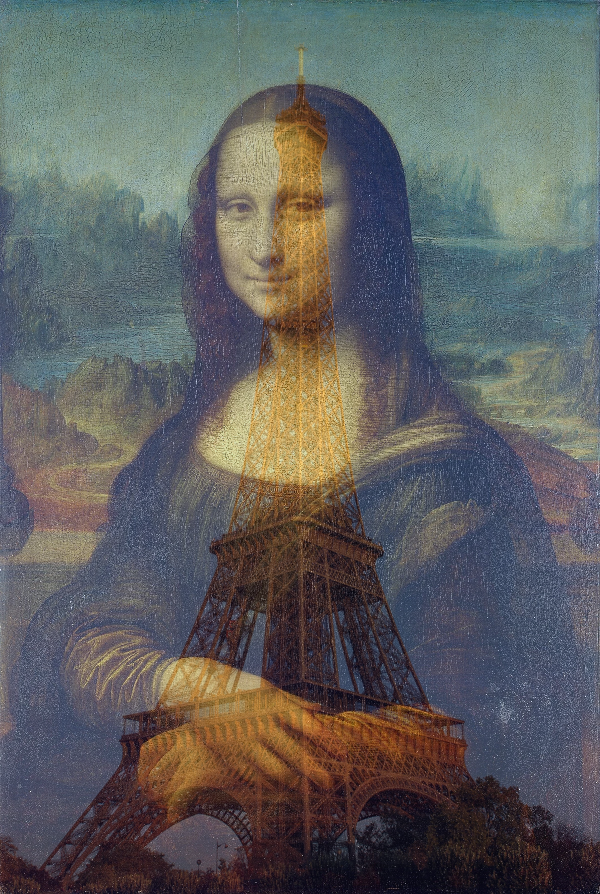

In [104]:
#import and resize second image

img_2 = np.array(Image.open('Eiffel.jpg').resize(reduced_M.shape[1::-1]))

def blend_image(image1, image2, visibility_1, visibility_2 ):

  #blend images by multiplying by visibility ratio for each image

  blend_image = (image1 * visibility_1 + image2 * visibility_2).astype(np.uint8)

  return blend_image

modified_image = Image.fromarray(blend_image(reduced_M, img_2, 0.7, 0.3))

display(modified_image)